In [1]:
import numpy as np
import pickle
from tqdm import tqdm_notebook as tqdm
import random
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import imageio
import time
import os

dataset = 'mars32k'

latent_vectors = np.load('latent_vectors_' + dataset + '.npy')
with open('filelist.pickle', 'rb') as f:
    filelist = np.array(pickle.load(f))

In [2]:
def dist(a, b):
    return np.linalg.norm(a-b) # l2 norm
    #return 1/(np.dot(a,b)/(np.linalg.norm(a)*np.linalg.norm(b))) # cosine dist

In [3]:
clusters = 128
classifications = np.zeros((len(latent_vectors)), dtype=np.int_)
centers = [random.choice(latent_vectors) for i in range(clusters)]

In [4]:
def find_center(x):
    center_distances = []
    for center in centers:
        center_distances.append(dist(center, x))
    return center_distances.index(min(center_distances))

In [9]:
use_custom_kmeans = False
iterations = 50

if use_custom_kmeans:
    for j in tqdm(range(iterations)):
        # classify
        for i, vec in enumerate(tqdm(latent_vectors, leave=False)):
            if j % 2 != 0:
                if not (i+j) % 10 == 0:
                    continue

            
            classifications[i] = find_center(vec)


        for cluster_id in range(len(centers)):
                sum_array = np.zeros((2048))
                sum_count = 0
                for i, vec in enumerate(latent_vectors):
                    if classifications[i] == cluster_id:
                        sum_array += vec
                        sum_count += 1

                centers[cluster_id] = sum_array / sum_count
else:
    t0 = time.time()
    kmeans = MiniBatchKMeans(verbose=1, n_clusters=clusters, init='k-means++', n_init=2, max_iter=iterations, random_state=0, n_jobs=1).fit(latent_vectors)
    classifications = kmeans.labels_
    centers = kmeans.cluster_centers_
    print(time.time()-t0)

KeyboardInterrupt: 

In [13]:
def get_rand_by_cluster(cluster, n):
    indices = np.flatnonzero(classifications == cluster)
    if len(indices) < 1:
        return []
    selected_indices = np.random.choice(indices, min(n, len(indices)), replace=False)
    return np.array(filelist)[selected_indices]

In [14]:
def plot_cluster(k):
    for j, file in enumerate(get_rand_by_cluster(k, 9)):
        ax = plt.subplot(3, 3, 1+j)
        image = imageio.imread(os.path.join('mars32k/', file))
        plt.imshow(image)

############################## Cluster 0 ##############################


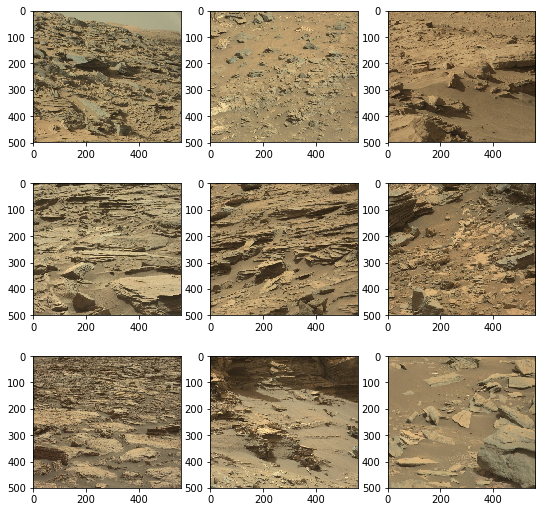

############################## Cluster 1 ##############################


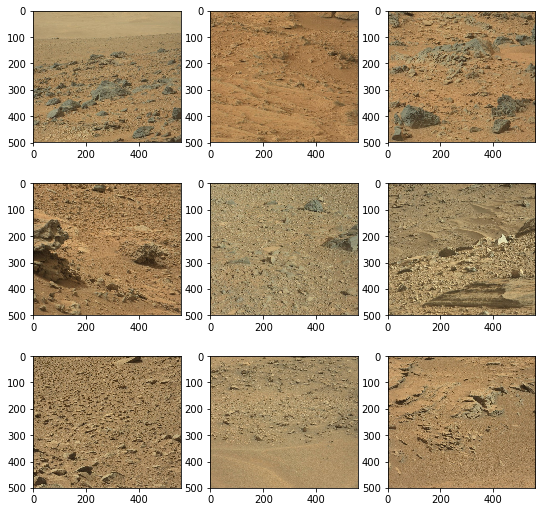

############################## Cluster 2 ##############################


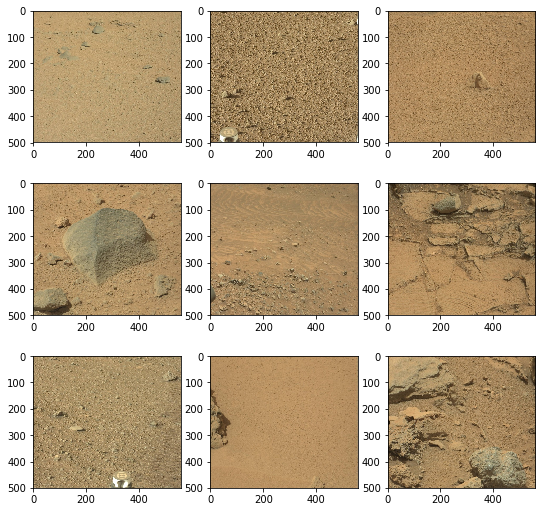

############################## Cluster 3 ##############################


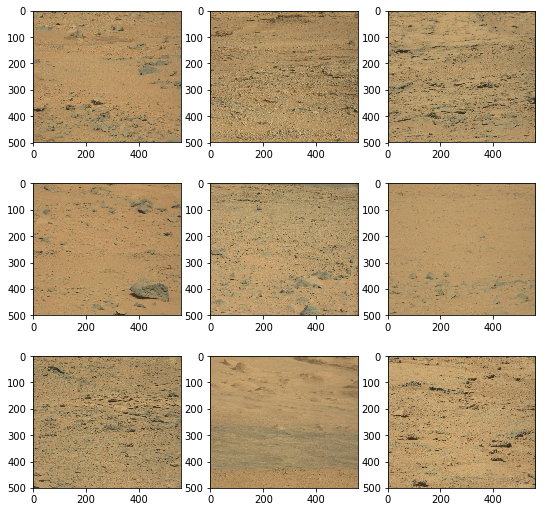

############################## Cluster 4 ##############################


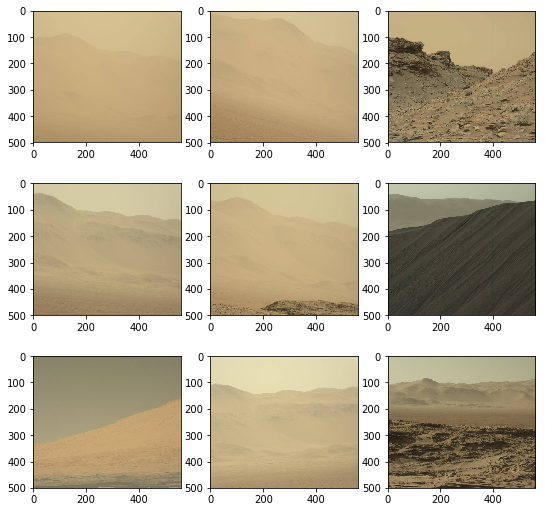

############################## Cluster 5 ##############################


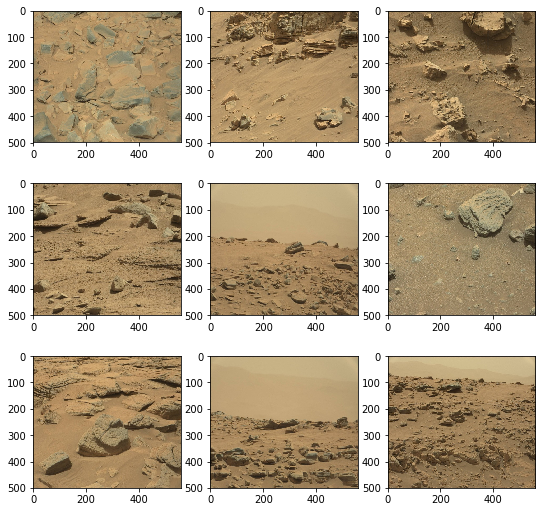

############################## Cluster 6 ##############################


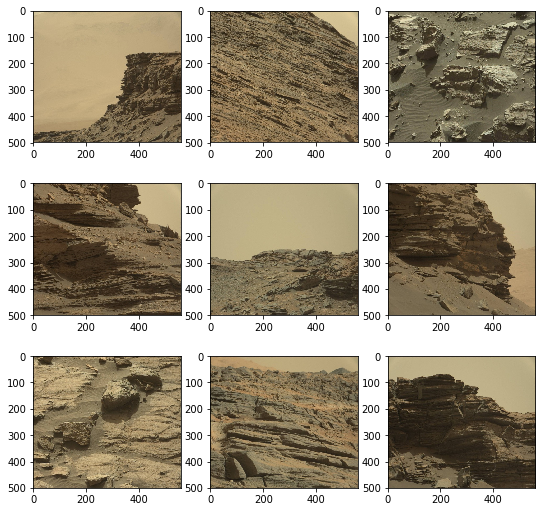

############################## Cluster 7 ##############################


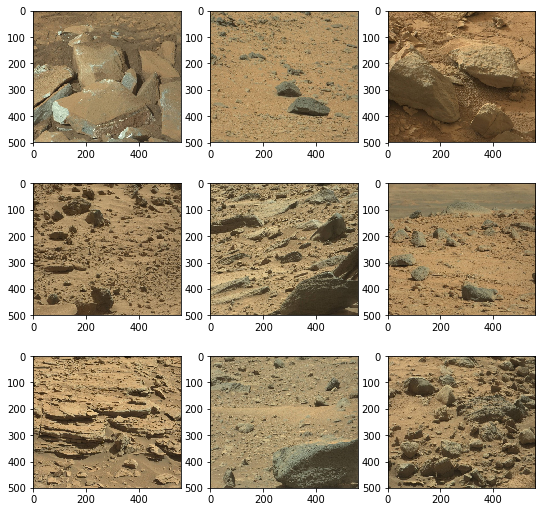

############################## Cluster 8 ##############################


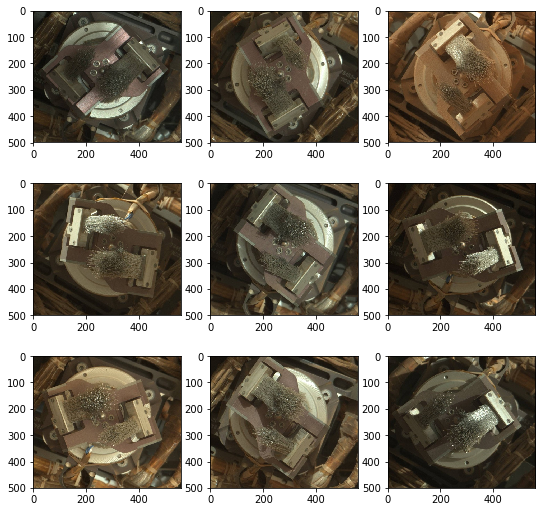

############################## Cluster 9 ##############################


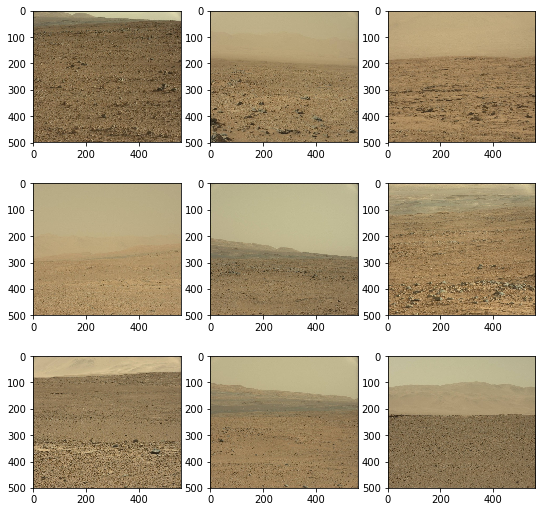

############################## Cluster 10 ##############################


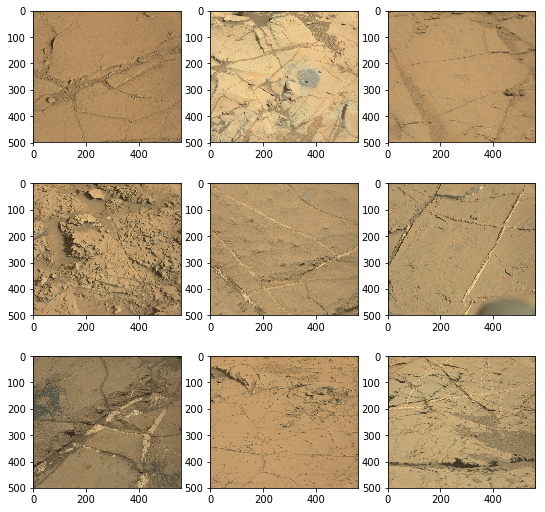

############################## Cluster 11 ##############################


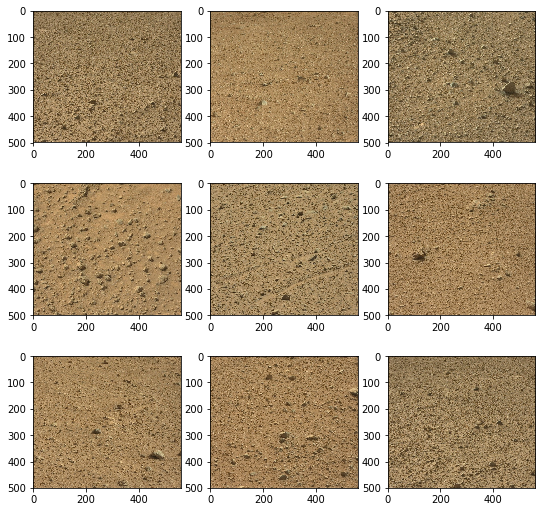

############################## Cluster 12 ##############################


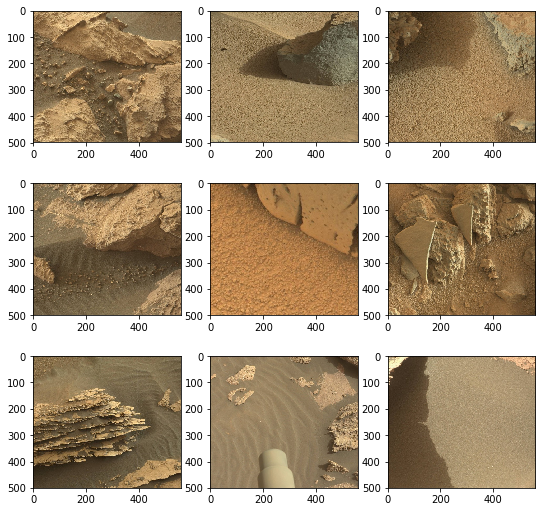

############################## Cluster 13 ##############################


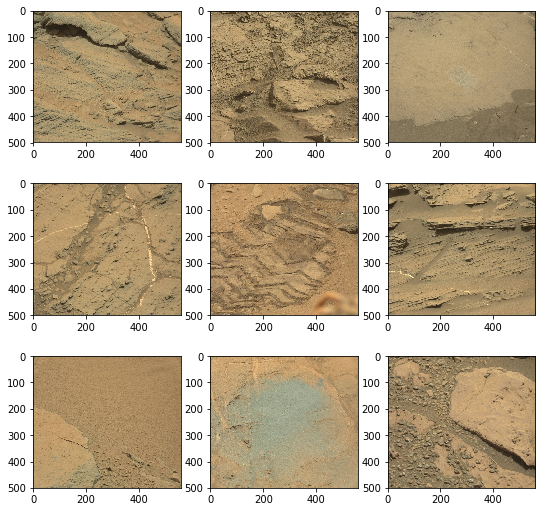

############################## Cluster 14 ##############################


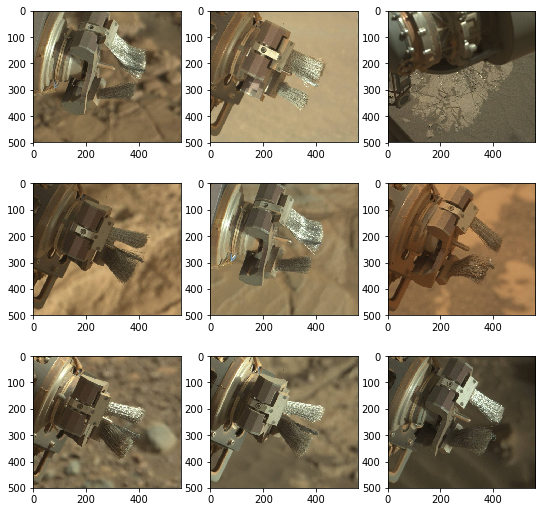

############################## Cluster 15 ##############################


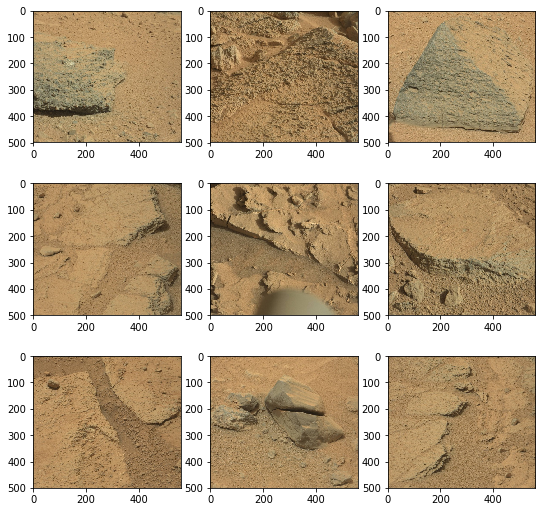

############################## Cluster 16 ##############################


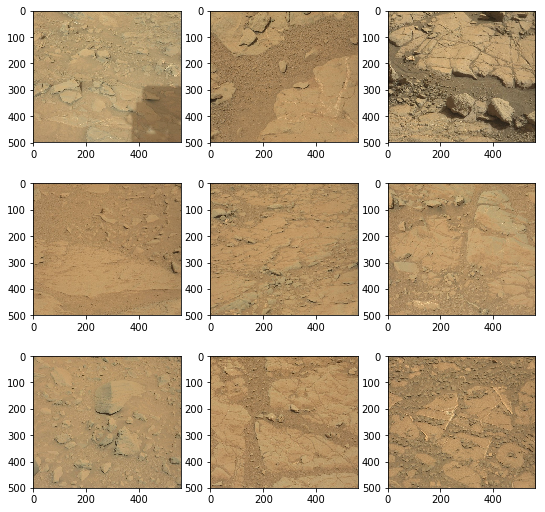

############################## Cluster 17 ##############################


KeyboardInterrupt: 

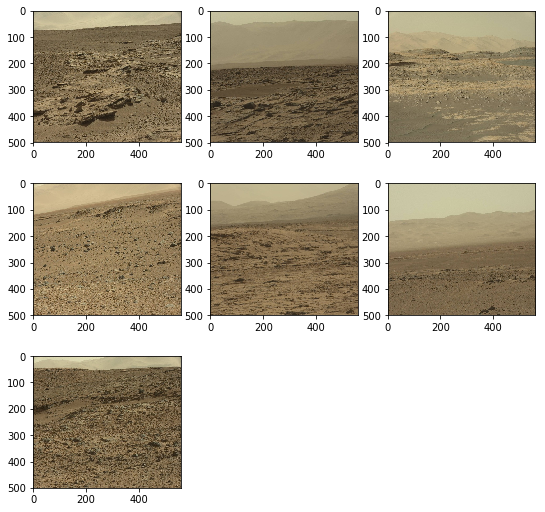

In [17]:
for k in range(clusters):
    plot = plt.figure(figsize=(9, 9))
    plot.patch.set_facecolor('white')
    print('#'*30, 'Cluster', k, '#'*30)
    plot_cluster(k)
    plt.show()

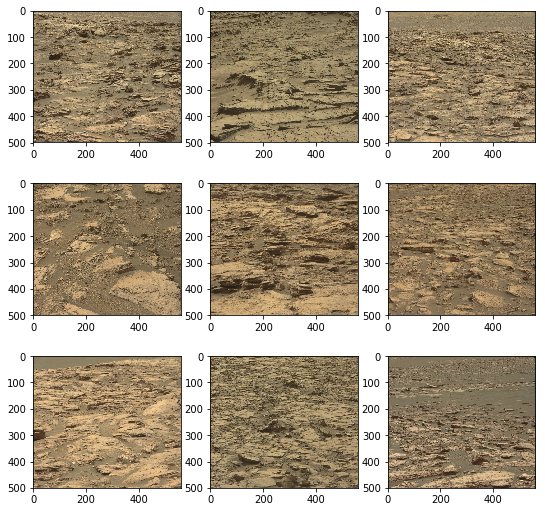

In [26]:
plot = plt.figure(figsize=(9, 9))
plot.patch.set_facecolor('white')
plot_cluster(100)